In [2]:
import numpy as np
import xarray as xr
from matplotlib import  pyplot as plt
import pandas as pd
import urllib
import cartopy.crs as ccrs
import datetime
from matplotlib import ticker
import os, sys
import pickle
import glob
from scipy.optimize import minimize
from os import path
from datetime import timedelta
from datetime import datetime
import cartopy.feature as cfeature
from matplotlib.ticker import FormatStrFormatter
import WetBulb
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from matplotlib.patches import Polygon
from tqdm import tqdm

In [3]:
# Define function for stickiness
def stickiness(T,q):
    v = [1.199557787089589, -7.75269363e+02, 3.02416275e-01, 3.08627625e+00,
              7.74095672e+03, 1.78241619e-03, -2.38012318e+02, -4.98714576e-01,
              2.40170949e+01, 7.18600120e+03, -2.75682633e-05, 4.29814844e+02,
              7.01883383e-03, -2.83672170e+02, -3.67109506e-01, 5.09430371e+00]
    
    stick = -1*(v[0] + v[1]*q + v[2]*T + v[3]*q*T + 
             v[4]*q**2 + v[5]*T**2 + v[6]*(q**2)*T + 
             v[7]*(T**2)*q + v[8]*(q**2)*(T**2) + 
             v[9]*q**3 + v[10]*T**3 + v[11]*(q**3)*T + 
             v[12]*(T**3)*q + v[13]*(q**3)*(T**2) + 
             v[14]*(T**3)*(q**2) + v[15]*(q**3)*(T**3))
    
    return stick

# Figure 9

## Load data

In [4]:
# Load single station data
NW_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/NWSouthAsia_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
mw_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/Midwest_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
SEaust_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/SEaust_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')
CMElimited_data = pd.read_csv("/dx01/ivanov/data/HadISD_stationdata/Spice/highTw_CMEstns_matcheddates_withdates.csv", index_col = 0, delimiter = '\t')

In [5]:
CMElimited_data['Stickiness'] = stickiness(CMElimited_data['Simul T'],CMElimited_data['Simul SH'])
NW_data['Stickiness'] = stickiness(NW_data['Simul T'],NW_data['Simul SH'])
mw_data['Stickiness'] = stickiness(mw_data['Simul T'],mw_data['Simul SH'])
SEaust_data['Stickiness'] = stickiness(SEaust_data['Simul T'],SEaust_data['Simul SH'])

In [6]:
# Create histograms of stickiness for 90th percentile Tw days for each region
NW_TW90 = NW_data['Wet Bulb'].quantile(0.9)
SEaust_TW90 = SEaust_data['Wet Bulb'].quantile(0.9)
mw_TW90 = mw_data['Wet Bulb'].quantile(0.9)
CMElimited_TW90 = CMElimited_data['Wet Bulb'].quantile(0.9)

NW_90days = NW_data[NW_data['Wet Bulb'] >= NW_TW90]
SEaust_90days = SEaust_data[SEaust_data['Wet Bulb'] >= SEaust_TW90]
mw_90days = mw_data[mw_data['Wet Bulb'] >= mw_TW90]
CMElimited_90days = CMElimited_data[CMElimited_data['Wet Bulb'] >= CMElimited_TW90]

## Prepare plotting elements

In [7]:
# Generate temperature range (in degrees C)
N_steps = 500

min_temp = 15
max_temp = 50

temp = np.linspace(min_temp,max_temp,N_steps)

# Generate specific humidity range (in kg/kg)
min_q = 0
max_q = 0.035

q = np.linspace(min_q, max_q, N_steps)

# Make gridded arrays
temp_grid, q_grid = np.meshgrid(temp, q) 

In [8]:
result = [1.199557787089589, -7.75269363e+02, 3.02416275e-01, 3.08627625e+00,
              7.74095672e+03, 1.78241619e-03, -2.38012318e+02, -4.98714576e-01,
              2.40170949e+01, 7.18600120e+03, -2.75682633e-05, 4.29814844e+02,
              7.01883383e-03, -2.83672170e+02, -3.67109506e-01, 5.09430371e+00]

v = [1.199557787089589, -7.75269363e+02, 3.02416275e-01, 3.08627625e+00,
              7.74095672e+03, 1.78241619e-03, -2.38012318e+02, -4.98714576e-01,
              2.40170949e+01, 7.18600120e+03, -2.75682633e-05, 4.29814844e+02,
              7.01883383e-03, -2.83672170e+02, -3.67109506e-01, 5.09430371e+00]

stick_TW = -1*(result[0] + result[1]*q_grid + result[2]*temp_grid + result[3]*q_grid*temp_grid + 
             result[4]*q_grid**2 + result[5]*temp_grid**2 + result[6]*(q_grid**2)*temp_grid + 
             result[7]*(temp_grid**2)*q_grid + result[8]*(q_grid**2)*(temp_grid**2) + 
             result[9]*q_grid**3 + result[10]*temp_grid**3 + result[11]*(q_grid**3)*temp_grid + 
             result[12]*(temp_grid**3)*q_grid + result[13]*(q_grid**3)*(temp_grid**2) + 
             result[14]*(temp_grid**3)*(q_grid**2) + result[15]*(q_grid**3)*(temp_grid**3))

In [9]:
from scipy.interpolate import griddata

def grid(x, y, z, resX=1000, resY=1000):
    #prepare to create grid
    xi = np.linspace(min(x), max(x), resX)
    yi = np.linspace(min(y), max(y), resY)

    #grid x, y, z
    X, Y = np.meshgrid(xi, yi)
    Z = griddata((x, y), z, (X, Y), method='linear')
    return X, Y, Z

In [10]:
# Generate temperature range (in degrees C)
N_steps = 500

min_temp = -5
max_temp = 65

temp = np.linspace(min_temp,max_temp,N_steps)

# Generate specific humidity range (in kg/kg)
min_q = 0
max_q = 0.065

q = np.linspace(min_q, max_q, N_steps)

# Make gridded arrays
temp_grid, q_grid = np.meshgrid(temp, q) 
RH_grid = 0.263*(1000*100)*q_grid*(np.exp((17.67*temp_grid/(temp_grid+273.15-29.65))))**(-1);

In [11]:
pres = 1000*100 # set general surface pressure to 1000 hPa
pres_grid = np.ones_like(temp_grid)*pres

Twb,Teq,epott = WetBulb.WetBulb(temp_grid, pres_grid, q_grid, HumidityMode = 0)
print('Wet bulb has been calculated')

/home/ivanov/jupyternb/Stickiness/to_upload/WetBulb.py:288: RuntimeWarning: divide by zero encountered in log
  tl = (1.0/((1.0/((T1 - 55))) - (np.log(relhum/100.0)/2840.0))) + 55.0


Wet bulb has been calculated


In [12]:
e_s = 6.11*np.exp(((2.5*(10**6))/461.52)*((1/273.15) - (1/(temp_grid+273.15)))) #saturation vapor pressure in hPa
e = e_s*RH_grid/100 #vapor pressure in hPa
sat_def = e_s - e #in hPa

In [13]:
temp_array = temp_grid.flatten(order = 'C')
q_array = q_grid.flatten(order = 'C')
spice_array = stick_TW.flatten(order = 'C')
TW_array = Twb.flatten(order = 'C')
RH_array = RH_grid.flatten(order = 'C')
SD_array = sat_def.flatten(order = 'C')
es_array = e_s.flatten(order = 'C')

In [14]:
data = pd.DataFrame({'Temperature': temp_array, 'Specific Humidity': q_array, 'Relative Humidity': RH_array, 'Wet Bulb': TW_array, 'Spice': spice_array, 'Saturation Deficit': SD_array, 'e_s': es_array})

In [15]:
# Select Clausius Clapeyron curve
data_CC = data[(data['Saturation Deficit'] <= 0.01) & (data['Saturation Deficit'] >= -0.01)]
data_CC_VPD = data[(data['Relative Humidity'] <= 100.1) & (data['Relative Humidity'] >= 99.9)]

In [16]:
wet_bulb,spice,temp_shifted = grid(data['Wet Bulb'], data['Spice'], data['Temperature'], resX=1000, resY=1000)

In [17]:
TW_SH, spice_SH, SH_shifted = grid(data['Wet Bulb'], data['Spice'], data['Specific Humidity'], resX=1000, resY=1000)

In [18]:
# Generate saturation curve
T_sat_K = np.linspace(-20+273.15,50+273.165,500)
T_sat = T_sat_K - 273.15
e = 6.11*np.exp(((2.5*10**6)/461.52)*((1/273.15) - (1/T_sat_K)))
SH_sat = 0.622*e/(1013.25 - 0.378*e)

# Calculate Tw and spice during these datapoints
pres = 1000*100 # set general surface pressure to 1000 hPa
pres_sat = np.ones_like(T_sat)*pres

TW_sat,Teq,epott = WetBulb.WetBulb(T_sat, pres_sat, SH_sat, HumidityMode = 0)
v = [0, -7.75269363e+02, 3.02416275e-01, 3.08627625e+00,
              7.74095672e+03, 1.78241619e-03, -2.38012318e+02, -4.98714576e-01,
              2.40170949e+01, 7.18600120e+03, -2.75682633e-05, 4.29814844e+02,
              7.01883383e-03, -2.83672170e+02, -3.67109506e-01, 5.09430371e+00]

stick_sat = -1*(v[0] + v[1]*SH_sat + v[2]*T_sat + v[3]*SH_sat*T_sat + 
             v[4]*SH_sat**2 + v[5]*T_sat**2 + v[6]*(SH_sat**2)*T_sat + 
             v[7]*(T_sat**2)*SH_sat + v[8]*(SH_sat**2)*(T_sat**2) + 
             v[9]*SH_sat**3 + v[10]*T_sat**3 + v[11]*(SH_sat**3)*T_sat + 
             v[12]*(T_sat**3)*SH_sat + v[13]*(SH_sat**3)*(T_sat**2) + 
             v[14]*(T_sat**3)*(SH_sat**2) + v[15]*(SH_sat**3)*(T_sat**3))

# Create dataframe with Clausius Clapeyron curve
sat_df = pd.DataFrame({'Temperature': T_sat, 'Specific Humidity': SH_sat, 'Wet Bulb': TW_sat, 'Stick': stick_sat})

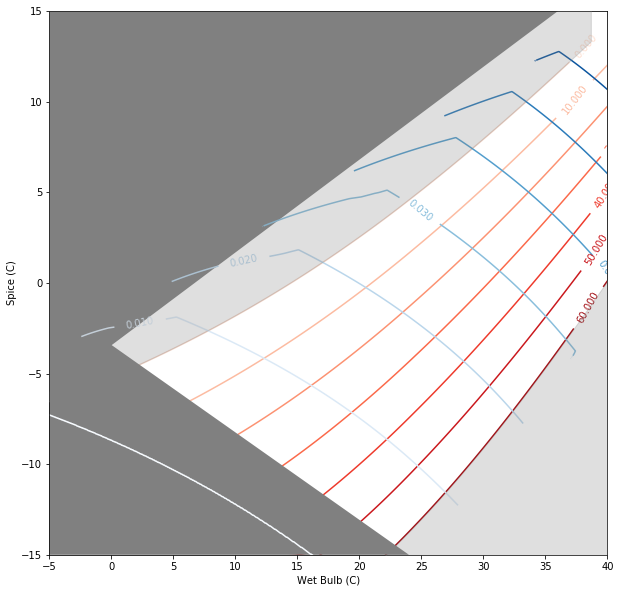

In [19]:
import matplotlib.patches as patches
from matplotlib.patches import Polygon

# Plot contours

fig, ax = plt.subplots(1,1, figsize=(10,10), facecolor='w', edgecolor='k')

temp_cont = plt.contour(wet_bulb, spice, temp_shifted, cmap = 'Reds', zorder = 1)
plt.clabel(temp_cont, inline=1, fontsize=10)

temp_0cont = temp_cont.allsegs[1][0]
temp_lowest_cont = temp_cont.allsegs[7][0]

SH_cont = plt.contour(wet_bulb, spice, SH_shifted, cmap = 'Blues', zorder = 2)
plt.clabel(SH_cont, inline=1, fontsize=10)

shading = plt.fill_between(temp_0cont[:,0],temp_0cont[:,1], 600,color='grey', alpha=.25, zorder = 7)
shading = plt.fill_between(temp_lowest_cont[:,0],temp_lowest_cont[:,1],-20, color='grey', alpha=.25, zorder = 7)

plt.xlabel('Wet Bulb (C)')
plt.ylabel('Spice (C)')
plt.xlim([-5,40])
plt.ylim([-15,15])

y1 = np.array([[-5,-6], [-5,15], [36,15]])
p1 = Polygon(y1, facecolor = 'grey')

y2 = np.array([[24,-15], [-5,-1], [-5,-15]])
p2 = Polygon(y2, facecolor = 'grey')

ax.add_patch(p1)
ax.add_patch(p2)

plt.show()

In [20]:
# Create colormap for background shading

from matplotlib.colors import LinearSegmentedColormap

large_color = '#882256'

cmap = LinearSegmentedColormap.from_list('mycmap', [ large_color,'white'])

In [ ]:
import string

# Plot all four together
contourshading_alpha = 0.65
markersize = 50
marker = 'P'

cont_col = ['#287733','#88CCEE','#CC6677','#332288']
line1 = Line2D([0], [0], color='grey', linestyle = 'solid')
line2 = Line2D([0], [0], color='grey', linestyle = 'dashed')
line3 = Line2D([0], [0], color=cont_col[0], linestyle = 'solid', linewidth = 4, alpha = 0.65)
line4 = Line2D([0], [0], color=cont_col[1], linestyle = 'solid', linewidth = 4, alpha = 0.65)
line5 = Line2D([0], [0], color=cont_col[2], linestyle = 'solid', linewidth = 4, alpha = 0.65)
line6 = Line2D([0], [0], color=cont_col[3], linestyle = 'solid', linewidth = 4, alpha = 0.65)
labels = ['Temperature', 'Specific Humidity','Persian Gulf','NW South Asia','SE Australia','US Midwest'] #'Gaussian KDE','Tw Isotherms',
reg_data = [CMElimited_data, NW_data, SEaust_data, mw_data]
reg_90 = [CMElimited_90days, NW_90days,SEaust_90days,mw_90days]

fig, axs = plt.subplots(1,2, figsize=(12,6), facecolor='w', edgecolor='k',gridspec_kw={'width_ratios': [3, 1]}, dpi = 1200)

# Plot four point histograms
xgrid = np.linspace(-5, 40, 50)
ygrid = np.linspace(-15, 15, 50)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)
trans = 1

levels = np.arange(0.002,0.03,0.0035)

temp_cont1 = axs[0].contour(wet_bulb, spice, temp_shifted, colors = 'grey', linestyles = 'solid', zorder = 1)
SH_cont1 = axs[0].contour(wet_bulb, spice, SH_shifted, colors = 'grey', linestyles = 'dashed', zorder = 1)

y2 = np.array([[24,-15], [-5,-1], [-5,-15]])
p2 = Polygon(y2, facecolor = 'white')

axs[0].add_patch(p2)

shading = axs[0].fill_between(temp_0cont[:,0],temp_0cont[:,1], 600,color='white', alpha=1, zorder = 2)
shading = axs[0].fill_between(temp_lowest_cont[:,0],temp_lowest_cont[:,1],-20, color='white', alpha=1, zorder = 2)
shading = axs[0].fill_between(sat_df['Wet Bulb'], sat_df['Stick'], 600,color='grey', alpha=.25, zorder = 3)

axs[0].set_xlim([-5,40])
axs[0].set_ylim([-15,15])
axs[0].set_ylabel('Stickiness (C)')
axs[0].set_xlabel('Wet Bulb (C)')
axs[0].legend([line1,line2,line3,line4,line5,line6],labels, loc = 2, borderpad = 1)
axs[0].text(-5, 16, string.ascii_lowercase[0], size=20, weight='bold')
    
for i in range(len(reg_data)):
    
    large_color = cont_col[i]

    cmap_cont = LinearSegmentedColormap.from_list('mycmap', [ large_color,'white'])
    
    reg = reg_data[i]
    data = np.vstack([reg['Wet Bulb'], reg['Stickiness']])
    kde = gaussian_kde(data)
    samples = np.vstack([Xgrid.ravel(), Ygrid.ravel()])
    Z = kde.evaluate(samples)
    
    # Find local maxima
    maxima_index = Z.argmax()
    maxima = samples[:,maxima_index]

    kde1 = axs[0].contourf(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap=cmap_cont, levels = levels, zorder = 5, alpha = contourshading_alpha)
    
    center = axs[0].scatter(maxima[0],maxima[1], s = markersize, marker= marker, color=large_color, zorder = 10)

axs[1].set_xlabel('Weighted Counts')
axs[1].set_ylim([-15,15])
axs[1].text(0, 16, string.ascii_lowercase[1], size=20, weight='bold')

for i in range(len(reg_90)):
    
    n, bins, patches = axs[1].hist(reg_90[i]['Stickiness'], 10, density=True, color=cont_col[i], alpha = 0.35, orientation='horizontal')
    n0, bins0, patches0 = axs[1].hist(reg_90[i]['Stickiness'], 10, density=True, edgecolor=cont_col[i], histtype = 'step', linewidth = 1, orientation='horizontal')

plt.savefig('figure9.png')
plt.show()

Note the code above can also be used to plot Figure S13 by plotting scatter plots for each subregion.

# Figure 10

In [48]:
col_names = ['stncodes','stnlats','stnlons','stnelevs']
stndata = pd.read_csv('/home/ivanov/matlab/Code/MJO_TW/hadisd_station_metadata_v2019.txt', delimiter = '\s+', header = None, names = col_names)

# Get individual pieces of station data
stncodes = stndata.stncodes.values
stnlats = stndata.stnlats.values
stnlons = stndata.stnlons.values
stnelevs = stndata.stnelevs.values

In [49]:
data_dir = "/dx01/ivanov/data/HadISD_stationdata/Spice/"
allstn_data = pd.read_csv(data_dir + 'stn_mean_stick_Twranges.csv', index_col = 0)

In [50]:
allstn_data = allstn_data.rename(columns={"stn_code": "stncodes"})
allstn_data = allstn_data.set_index('stncodes')
stndata_stncodes = stndata.set_index('stncodes')

In [51]:
combined_df = pd.concat([stndata_stncodes, allstn_data], axis=1, join="outer")

In [57]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid

def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero
    
    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower ofset). Should be between
          0.0 and 1.0.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax/(vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highets point in the colormap's range.
          Defaults to 1.0 (no upper ofset). Should be between
          0.0 and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }
      
    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])
    
    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))
        
    newcmap = matplotlib.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)

    return newcmap

In [58]:
fig, axs = plt.subplots(3,1,figsize = (10,12), facecolor = 'w', edgecolor = 'k',constrained_layout=True, subplot_kw = {'projection': ccrs.PlateCarree()}, dpi = 1200)
plot_names = ['25-26','27-28','29-30']

orig_cmap = matplotlib.cm.BrBG
shifted_cmap = shiftedColorMap(orig_cmap, midpoint=0.2, name='shifted')

# Plot
for i, ax in enumerate(fig.axes):
    
    data = combined_df[plot_names[i]]
    
    scat = ax.scatter(combined_df.stnlons,combined_df.stnlats, c = data, s = 3, vmin = -2, vmax = 8, cmap = shifted_cmap)  
    
    ax.coastlines(linewidth=1)
    ax.set_xlim(-180,180)
    ax.set_ylim(-60,90)
    ax.set_xticks([-180,-90,0,90,180], crs=ccrs.PlateCarree())
    ax.set_yticks([-60,-30,0,30,60,90], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND, facecolor = 'darkgrey')
    
    if i in [0,1,2]:
        ax.set_ylabel('Latitude')
    if i ==2:
        ax.set_xlabel('Longitude')
    
    ax.set_title('Tw = ' + plot_names[i] + 'C', fontweight = 'bold')
    
cbar = plt.colorbar(scat, ax=axs.ravel().tolist(), shrink = 0.5, location = 'bottom', pad = 0.05)
tick_locator = ticker.MaxNLocator(nbins=5)
cbar.locator = tick_locator
cbar.update_ticks()
cbar.set_label('Stickiness (C)')

plt.savefig('figure10.png')

plt.show()

# Figure S12

In [30]:
data = pd.DataFrame({'Temperature': temp_array, 'Specific Humidity': q_array, 'Relative Humidity': RH_array, 'Wet Bulb': TW_array, 'Spice': spice_array, 'Saturation Deficit': SD_array, 'e_s': es_array})
TW_temp,T_temp,SH_temp = grid(data['Wet Bulb'], data['Temperature'], data['Specific Humidity'], resX=1000, resY=1000)

In [32]:
# Selec Clausius Clapeyron curve
data_CC_SD = data[(data['Saturation Deficit'] <= 0.01) & (data['Saturation Deficit'] >= -0.01)]
data_CC_RH = data[(data['Relative Humidity'] <= 100.1) & (data['Relative Humidity'] >= 99.9)]

In [34]:
from scipy import stats

r = -0.379
r = 0.303
r = 0.665
r = 0.77


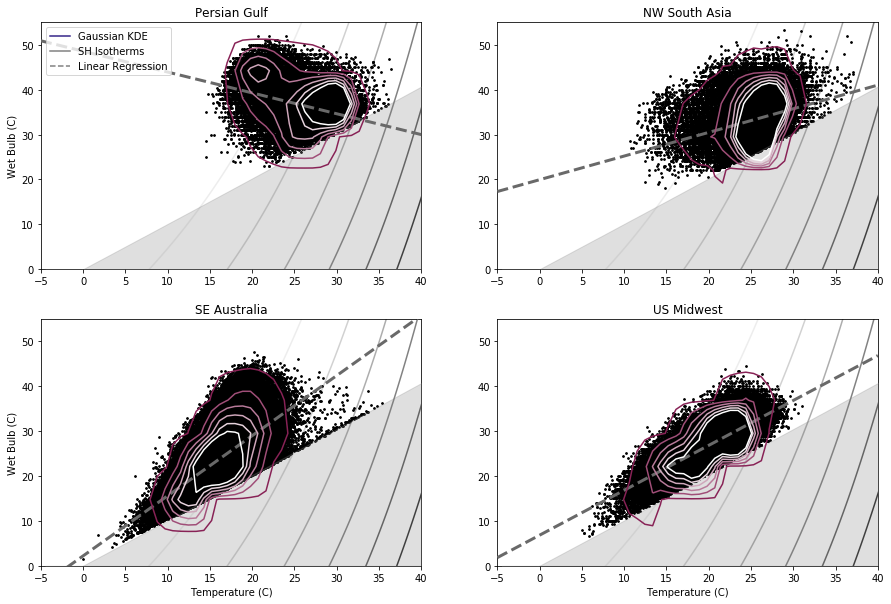

In [35]:
# Plot Tw vs. temperature

xgrid = np.linspace(-5, 40, 50)
ygrid = np.linspace(0, 140, 20)
Xgrid, Ygrid = np.meshgrid(xgrid, ygrid)

line1 = Line2D([0], [0], color=large_color, linestyle = 'solid')
line2 = Line2D([0], [0], color='grey', linestyle = 'solid')
line3 = Line2D([0], [0], color='grey', linestyle = 'dashed')
labels = ['Gaussian KDE', 'SH Isotherms','Linear Regression']

reg_data = [CMElimited_data, NW_data, SEaust_data, mw_data]
titles = ['Persian Gulf', 'NW South Asia','SE Australia','US Midwest']
levels = np.arange(0.0002,0.004+0.002,0.001)

fig, axs = plt.subplots(2,2, figsize=(15,10), facecolor='w', edgecolor='k')

for i, ax in enumerate(fig.axes):
    
    reg = reg_data[i]
    data = np.vstack([reg['Wet Bulb'], reg['Simul T']])
    kde = gaussian_kde(data)
    Z = kde.evaluate(np.vstack([Xgrid.ravel(), Ygrid.ravel()]))

    # Plot the result as an image
    scatter1 = ax.scatter(reg['Wet Bulb'], reg['Simul T'], color = 'k', s = 3, zorder = 4)

    cont1 = ax.contour(Xgrid, Ygrid, Z.reshape(Xgrid.shape), cmap=cmap, levels = levels, zorder = 6)
    T_cont = ax.contour(TW_temp, T_temp, SH_temp, cmap = 'Greys', zorder = 1)
    shading = ax.fill_between(data_CC_SD['Wet Bulb'], data_CC_SD['Temperature'], 0, color='grey', alpha=.25, zorder = 4)
    ax.set_title(titles[i])
    ax.set_xlim([-5,40])
    ax.set_ylim([0,55])
    
    if i == 0:
        ax.legend([line1, line2,line3],labels, loc = 2)
    
    if i == 0 or i == 2:
        ax.set_ylabel('Wet Bulb (C)')
    
    if i >= 2:
        ax.set_xlabel('Temperature (C)')  
        
    # Add in regression line
    res = stats.linregress(reg['Wet Bulb'],reg['Simul T'])
    
    xmin = -5
    xmax = 40
    x = np.linspace(xmin,xmax,50)

    ax.plot(x, res.intercept + res.slope*x, 'dimgrey', linestyle='dashed', linewidth = 3, zorder = 5)
    print('r = ' + str(round(res.rvalue,3)))
        
plt.show()